In [2]:
import pandas as pd

In [3]:
from sklearn import datasets

In [4]:
import matplotlib.pyplot as plt

In [5]:
df = pd.read_csv('movies.csv', encoding='latin1')

In [6]:
df

,id,budget,genres,homePage,productionCompany,productionCompanyCountry,productionCountry,revenue,runtime,video,...,popularity,releaseDate,voteAvg,voteCount,genresAmount,productionCoAmount,productionCountriesAmount,actorsAmount,castWomenAmount,castMenAmount
0,5,4000000,Crime|Comedy,https://www.miramax.com/movie/four-rooms/,Miramax|A Band Apart,US|US,United States of America,4257354.0,98,False,...,20.880,1995-12-09,5.7,2077,2,2,1,25,15,9
1,6,21000000,Action|Thriller|Crime,NaN,Universal Pictures|Largo Entertainment|JVC,US|US|JP,Japan|United States of America,12136938.0,110,False,...,9.596,1993-10-15,6.5,223,3,3,2,15,3,9
2,11,11000000,Adventure|Action|Science Fiction,http://www.starwars.com/films/star-wars-episod...,Lucasfilm|20th Century Fox,US|US,United States of America,775398007.0,121,NaN,...,100.003,1977-05-25,8.2,16598,3,2,1,105,5,62
3,12,94000000,Animation|Family,http://movies.disney.com/finding-nemo,Pixar,US,United States of America,940335536.0,100,NaN,...,134.435,2003-05-30,7.8,15928,2,1,1,24,5,18
4,13,55000000,Comedy|Drama|Romance,NaN,Paramount|The Steve Tisch Company,US|,United States of America,677387716.0,142,False,...,58.751,1994-07-06,8.5,22045,3,2,1,76,18,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,920081,0,Action|Horror,NaN,NaN,NaN,NaN,0.0,100,False,...,16.662,2021-11-26,6.8,108,2,1,1,10,2,4
9996,920143,0,Comedy,NaN,Caracol Televisión|Dago García Producciones,CO|CO,Colombia,0.0,97,False,...,491.706,2021-12-25,1.5,2,1,2,1,8,1,1
9997,922017,0,Comedy,NaN,NaN,NaN,Nigeria,0.0,112,False,...,565.658,2021-12-17,6.1,30,1,1,17,1,0,922017
9998,922162,0,NaN,https://www.netflix.com/title/81425229,NaN,NaN,United States of America,0.0,59,False,...,9.664,2021-12-17,6.0,1,1,0,0,0,922162,The Witcher: Fireplace


In [7]:
dfvoteAvg = df.sort_values(by=['voteAvg'], ascending=True)

In [8]:
dfvoteAvg.loc[:,['title', 'voteAvg']].head(3)

,title,voteAvg
9786,DAKAICHI -I'm Being Harassed by the Sexiest Ma...,1.3
9996,El Paseo 6,1.5
9944,Harry Potter: Different Perspective,1.5


In [9]:
df.releaseDate = pd.to_datetime(df.releaseDate)

In [10]:
dfmoviesYear = df.groupby(df.releaseDate.dt.year).count().rename_axis('year')['releaseDate'].reset_index(name='Movies')

In [11]:
dfmoviesYear = dfmoviesYear.sort_values(by=['Movies'], ascending=False)

In [12]:
dfmoviesYear

,year,Movies
97,2021,816
94,2018,629
93,2017,618
95,2019,612
92,2016,557
...,...,...
11,1933,1
12,1935,1
13,1936,1
14,1937,1


<AxesSubplot: title={'center': 'Movies per year'}, xlabel='year'>

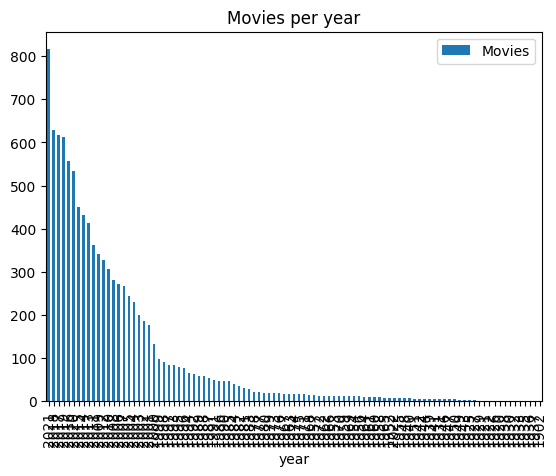

In [13]:
dfmoviesYear.plot.bar(x='year', y='Movies', title='Movies per year')

In [14]:
df

,id,budget,genres,homePage,productionCompany,productionCompanyCountry,productionCountry,revenue,runtime,video,...,popularity,releaseDate,voteAvg,voteCount,genresAmount,productionCoAmount,productionCountriesAmount,actorsAmount,castWomenAmount,castMenAmount
0,5,4000000,Crime|Comedy,https://www.miramax.com/movie/four-rooms/,Miramax|A Band Apart,US|US,United States of America,4257354.0,98,False,...,20.880,1995-12-09,5.7,2077,2,2,1,25,15,9
1,6,21000000,Action|Thriller|Crime,NaN,Universal Pictures|Largo Entertainment|JVC,US|US|JP,Japan|United States of America,12136938.0,110,False,...,9.596,1993-10-15,6.5,223,3,3,2,15,3,9
2,11,11000000,Adventure|Action|Science Fiction,http://www.starwars.com/films/star-wars-episod...,Lucasfilm|20th Century Fox,US|US,United States of America,775398007.0,121,NaN,...,100.003,1977-05-25,8.2,16598,3,2,1,105,5,62
3,12,94000000,Animation|Family,http://movies.disney.com/finding-nemo,Pixar,US,United States of America,940335536.0,100,NaN,...,134.435,2003-05-30,7.8,15928,2,1,1,24,5,18
4,13,55000000,Comedy|Drama|Romance,NaN,Paramount|The Steve Tisch Company,US|,United States of America,677387716.0,142,False,...,58.751,1994-07-06,8.5,22045,3,2,1,76,18,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,920081,0,Action|Horror,NaN,NaN,NaN,NaN,0.0,100,False,...,16.662,2021-11-26,6.8,108,2,1,1,10,2,4
9996,920143,0,Comedy,NaN,Caracol Televisión|Dago García Producciones,CO|CO,Colombia,0.0,97,False,...,491.706,2021-12-25,1.5,2,1,2,1,8,1,1
9997,922017,0,Comedy,NaN,NaN,NaN,Nigeria,0.0,112,False,...,565.658,2021-12-17,6.1,30,1,1,17,1,0,922017
9998,922162,0,NaN,https://www.netflix.com/title/81425229,NaN,NaN,United States of America,0.0,59,False,...,9.664,2021-12-17,6.0,1,1,0,0,0,922162,The Witcher: Fireplace


In [15]:
dfmainGenre = df.groupby('genres').agg(genC = ('genres', 'count'))

In [16]:
dfmainGenre = dfmainGenre.sort_values(by=['genC'], ascending=False)

In [17]:
dfmainGenre

,genC
genres,
Drama,521
Comedy,440
Horror,230
Drama|Romance,211
Horror|Thriller,205
...,...
Adventure|Family|Animation|Action|Comedy,1
Adventure|Family|Drama|Comedy,1
Drama|Horror|Romance|Thriller,1


In [18]:
#dfmainGenre.plot.pie(y='genC', figsize=(25, 25), labeldistance=None)

<AxesSubplot: ylabel='genC'>

In [19]:
df

,id,budget,genres,homePage,productionCompany,productionCompanyCountry,productionCountry,revenue,runtime,video,...,popularity,releaseDate,voteAvg,voteCount,genresAmount,productionCoAmount,productionCountriesAmount,actorsAmount,castWomenAmount,castMenAmount
0,5,4000000,Crime|Comedy,https://www.miramax.com/movie/four-rooms/,Miramax|A Band Apart,US|US,United States of America,4257354.0,98,False,...,20.880,1995-12-09,5.7,2077,2,2,1,25,15,9
1,6,21000000,Action|Thriller|Crime,NaN,Universal Pictures|Largo Entertainment|JVC,US|US|JP,Japan|United States of America,12136938.0,110,False,...,9.596,1993-10-15,6.5,223,3,3,2,15,3,9
2,11,11000000,Adventure|Action|Science Fiction,http://www.starwars.com/films/star-wars-episod...,Lucasfilm|20th Century Fox,US|US,United States of America,775398007.0,121,NaN,...,100.003,1977-05-25,8.2,16598,3,2,1,105,5,62
3,12,94000000,Animation|Family,http://movies.disney.com/finding-nemo,Pixar,US,United States of America,940335536.0,100,NaN,...,134.435,2003-05-30,7.8,15928,2,1,1,24,5,18
4,13,55000000,Comedy|Drama|Romance,NaN,Paramount|The Steve Tisch Company,US|,United States of America,677387716.0,142,False,...,58.751,1994-07-06,8.5,22045,3,2,1,76,18,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,920081,0,Action|Horror,NaN,NaN,NaN,NaN,0.0,100,False,...,16.662,2021-11-26,6.8,108,2,1,1,10,2,4
9996,920143,0,Comedy,NaN,Caracol Televisión|Dago García Producciones,CO|CO,Colombia,0.0,97,False,...,491.706,2021-12-25,1.5,2,1,2,1,8,1,1
9997,922017,0,Comedy,NaN,NaN,NaN,Nigeria,0.0,112,False,...,565.658,2021-12-17,6.1,30,1,1,17,1,0,922017
9998,922162,0,NaN,https://www.netflix.com/title/81425229,NaN,NaN,United States of America,0.0,59,False,...,9.664,2021-12-17,6.0,1,1,0,0,0,922162,The Witcher: Fireplace


In [30]:
dfmainRevenue = df.groupby('genres').agg(revenueSum = ('revenue', 'sum'))

In [31]:
dfmainRevenue = dfmainRevenue.sort_values(by=['revenueSum'], ascending=False)

In [34]:
dfmainRevenue.head(5)

,revenueSum
genres,
Action|Adventure|Science Fiction,1.978039e+10
Comedy,1.707417e+10
Comedy|Romance,1.377524e+10
Drama,1.277139e+10
Action|Adventure|Fantasy,1.154096e+10


In [35]:
df

,id,budget,genres,homePage,productionCompany,productionCompanyCountry,productionCountry,revenue,runtime,video,...,popularity,releaseDate,voteAvg,voteCount,genresAmount,productionCoAmount,productionCountriesAmount,actorsAmount,castWomenAmount,castMenAmount
0,5,4000000,Crime|Comedy,https://www.miramax.com/movie/four-rooms/,Miramax|A Band Apart,US|US,United States of America,4257354.0,98,False,...,20.880,1995-12-09,5.7,2077,2,2,1,25,15,9
1,6,21000000,Action|Thriller|Crime,NaN,Universal Pictures|Largo Entertainment|JVC,US|US|JP,Japan|United States of America,12136938.0,110,False,...,9.596,1993-10-15,6.5,223,3,3,2,15,3,9
2,11,11000000,Adventure|Action|Science Fiction,http://www.starwars.com/films/star-wars-episod...,Lucasfilm|20th Century Fox,US|US,United States of America,775398007.0,121,NaN,...,100.003,1977-05-25,8.2,16598,3,2,1,105,5,62
3,12,94000000,Animation|Family,http://movies.disney.com/finding-nemo,Pixar,US,United States of America,940335536.0,100,NaN,...,134.435,2003-05-30,7.8,15928,2,1,1,24,5,18
4,13,55000000,Comedy|Drama|Romance,NaN,Paramount|The Steve Tisch Company,US|,United States of America,677387716.0,142,False,...,58.751,1994-07-06,8.5,22045,3,2,1,76,18,48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,920081,0,Action|Horror,NaN,NaN,NaN,NaN,0.0,100,False,...,16.662,2021-11-26,6.8,108,2,1,1,10,2,4
9996,920143,0,Comedy,NaN,Caracol Televisión|Dago García Producciones,CO|CO,Colombia,0.0,97,False,...,491.706,2021-12-25,1.5,2,1,2,1,8,1,1
9997,922017,0,Comedy,NaN,NaN,NaN,Nigeria,0.0,112,False,...,565.658,2021-12-17,6.1,30,1,1,17,1,0,922017
9998,922162,0,NaN,https://www.netflix.com/title/81425229,NaN,NaN,United States of America,0.0,59,False,...,9.664,2021-12-17,6.0,1,1,0,0,0,922162,The Witcher: Fireplace


In [92]:
dfmainRevenue = df.sort_values(by=['actorsAmount'], ascending=False)

In [95]:
dfmainRevenue.loc[:,['title','actorsAmount', 'releaseDate']].head(60)

,title,actorsAmount,releaseDate
9994,Phantastische Harry Potter Momente - Das große...,919590,2021-10-31
9953,Ben 10 Alien X-tinction,882878,2021-04-11
9875,El Chavo Del Ocho: Lo Mejor De Don Ramon,853253,2006-03-21
9845,Yumbina: La droga del sexo,840964,2006-12-31
9806,Sex Education Films,825491,2017-01-01
9767,El sexo me da risa 8,815762,2018-12-31
9706,DRagON BALL P2 2wice dropda bbeet,796822,2008-07-01
9655,Live Spectacle NARUTO ~Song of the Akatsuki~,784594,2021-01-07
9577,The Roots of Wolverine: A Conversation with X-...,765207,2009-09-15
9524,Dangerous Lesson,750209,2020-10-02


In [103]:
dfPopularity = df.sort_values(by=['popularity'], ascending=False)

In [109]:
dfPopularity.loc[:,['popularity', 'title', 'revenue', 'castWomenAmount', 'castMenAmount']].head(20)

,popularity,title,revenue,castWomenAmount,castMenAmount
8225,11474.647,Eternals,4.018423e+08,11,25
9049,8443.740,Spider-Man: No Way Home,1.631853e+09,13,33
7352,6055.643,Sing 2,2.150000e+08,8,13
7614,5887.379,Resident Evil: Welcome to Raccoon City,3.100000e+07,9,10
8556,5804.441,Encanto,2.150000e+08,9,9
7179,5051.222,Ghostbusters: Afterlife,1.910000e+08,12,18
9898,4789.705,Last Man Down,0.000000e+00,3,2
8995,3828.374,The Matrix Resurrections,1.480000e+08,15,34
8650,3062.764,Venom: Let There Be Carnage,5.000000e+08,11,26
9485,2466.985,Mother/Android,0.000000e+00,8,12
